In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
# Misc
import os, sys

# Include stuff in src folder
sys.path.append('../src')

from glob import glob

In [3]:
import random

In [4]:
# Dataframes and such
import pandas as pd
import numpy as np

In [5]:
# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
# Ipython stuff
import IPython
import IPython.display as ipd

In [7]:
# Audio stuff
import librosa
import librosa.display

In [8]:
from data_augmentation import time_stretch_random, shift_pitch_random, reverb_random, noise_random

In [9]:
DATA_FOLDER = "../data/gtzan"

## Sample audio files

In [10]:
# Had to remove jazz file #54 because of corruption, apparently

In [11]:
# Make a list of all the wav files in the dataset and store them in a variable
audio_files = glob(f"{DATA_FOLDER}/*/*.wav")

In [12]:
# GTZAN index
# https://vbn.aau.dk/ws/portalfiles/portal/300255352/GTZANindex.txt
# random_file = random.choice(audio_files)
# The memory remains
random_file = "../data/gtzan/metal/metal.00073.wav"

print(f"Showing random file {os.path.basename(random_file)}")
ipd.Audio(random_file)

Showing random file metal.00073.wav


In [13]:
# Load audio file with librosa
y, sr = librosa.load(random_file)

print(f"y is a {type(y)}, sr is a {type(sr)}")
print(f"First 10 elements of y: {y[:10]}")
print(f"Shape of Y: {y.shape}")
print(f"Sample Rate: {sr}")

y is a <class 'numpy.ndarray'>, sr is a <class 'int'>
First 10 elements of y: [ 0.11010742  0.11685181  0.11102295 -0.04159546 -0.17938232 -0.20321655
 -0.25631714 -0.21850586  0.09094238  0.27270508]
Shape of Y: (661504,)
Sample Rate: 22050


### Original

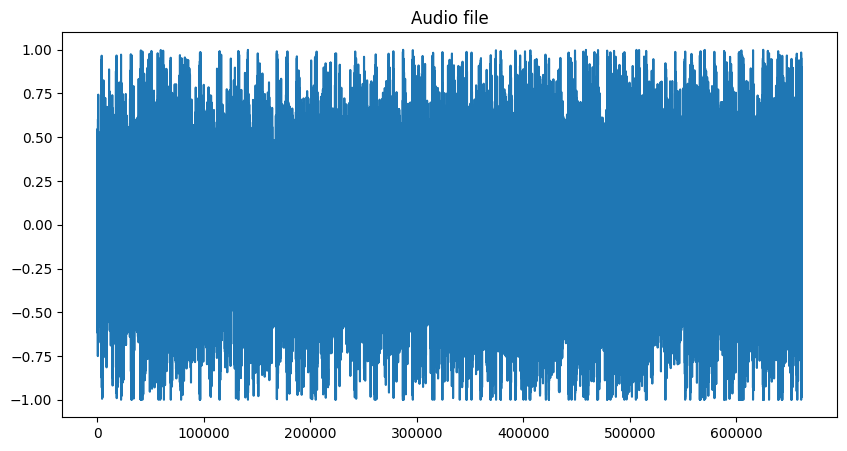

In [14]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y).plot(figsize=(10, 5), title="Audio file");

### Pitch shift

In [15]:
y_pitch = shift_pitch_random(y, sr)

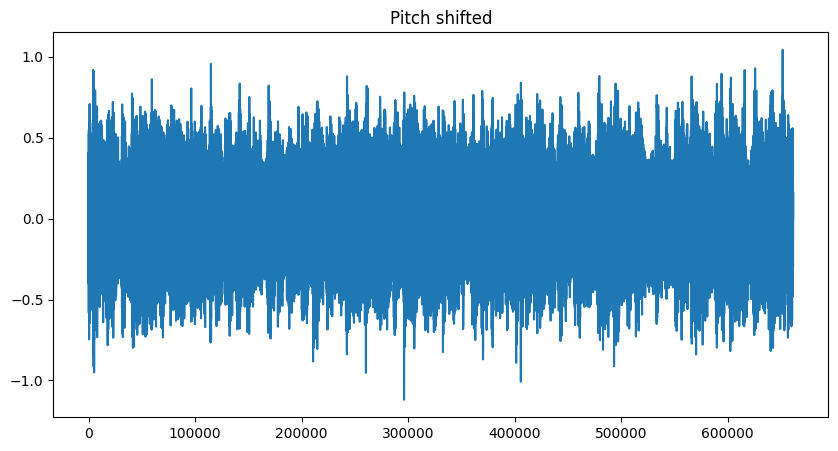

In [16]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y_pitch).plot(figsize=(10, 5), title="Pitch shifted");

In [17]:
ipd.Audio(y_pitch, rate=sr)

### Time stretch

In [18]:
y_time_stretch = time_stretch_random(y, sr)

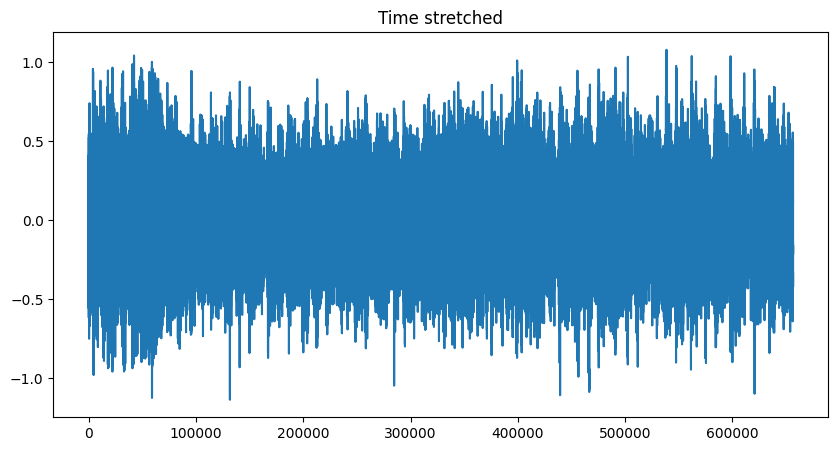

In [19]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y_time_stretch).plot(figsize=(10, 5), title="Time stretched");

In [20]:
from librosa.effects import pitch_shift

In [21]:
ipd.Audio(y_time_stretch, rate=sr)

### Reverb

In [22]:
y_reverb = reverb_random(y, sr)

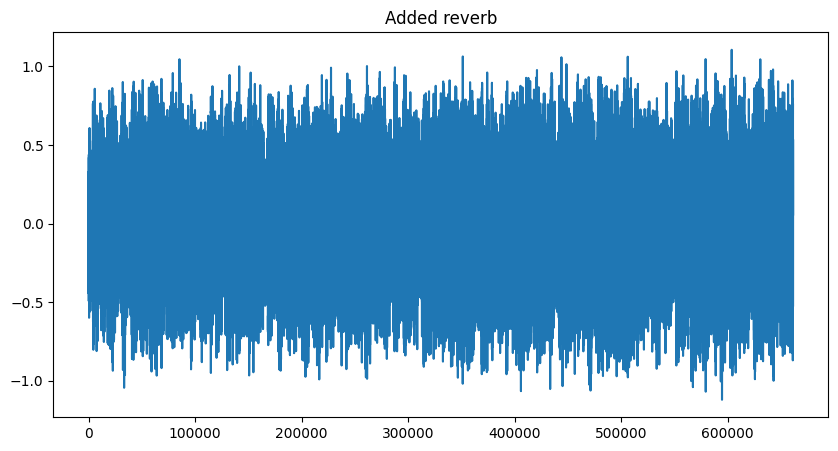

In [23]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y_reverb).plot(figsize=(10, 5), title="Added reverb");

In [24]:
ipd.Audio(y_reverb, rate=sr)

### Noise

In [25]:
y_noise = noise_random(y, sr)

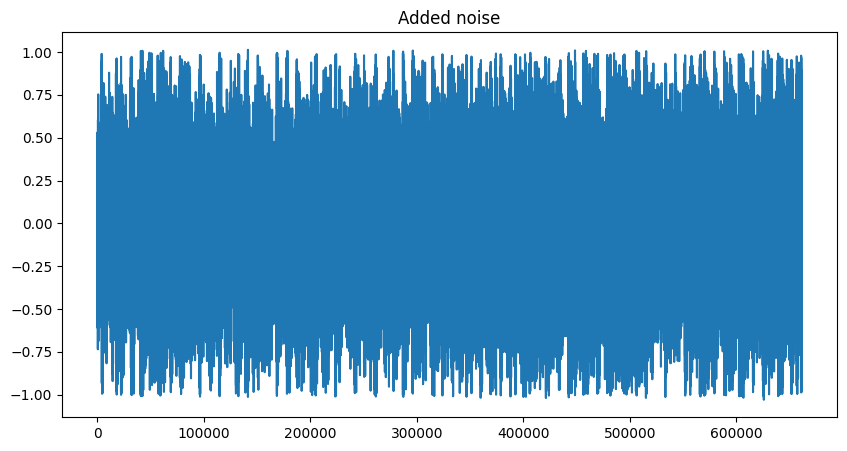

In [26]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y_noise).plot(figsize=(10, 5), title="Added noise");

In [27]:
ipd.Audio(y, rate=sr)

In [28]:
ipd.Audio(y_noise, rate=sr)

### All together

In [29]:
%%time

# Control amount of augmentation to prevent distorting the sample too much
intensities = np.random.uniform(size=(3,))
intensities /= intensities.sum()

y_aug = shift_pitch_random(y, sr, intensity=intensities[0])
y_aug = time_stretch_random(y_aug, sr, intensity=intensities[1])
y_aug = reverb_random(y_aug, sr, intensity=intensities[2])
y_aug = noise_random(y_aug, sr)

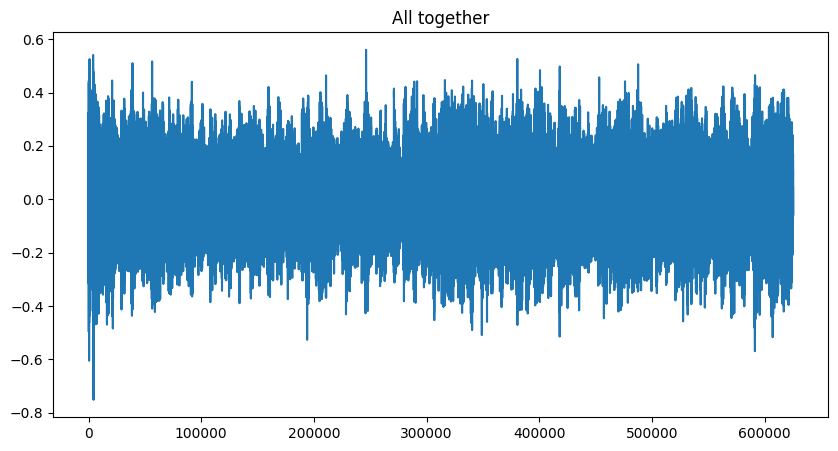

In [31]:
# Plot the actual wave
plt.figure(figsize=(16, 8))
pd.Series(y_aug).plot(figsize=(10, 5), title="All together");

In [32]:
print("Original")
ipd.Audio(y, rate=sr)

Original


In [33]:
print("Augmented")
ipd.Audio(y_aug, rate=sr)

Augmented


## MEL Spectrograms

In [34]:
# apply mel spectogram without STFT

hop_length = 512

n_fft = 2048
n_mels = 256

## Original

In [35]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1293)


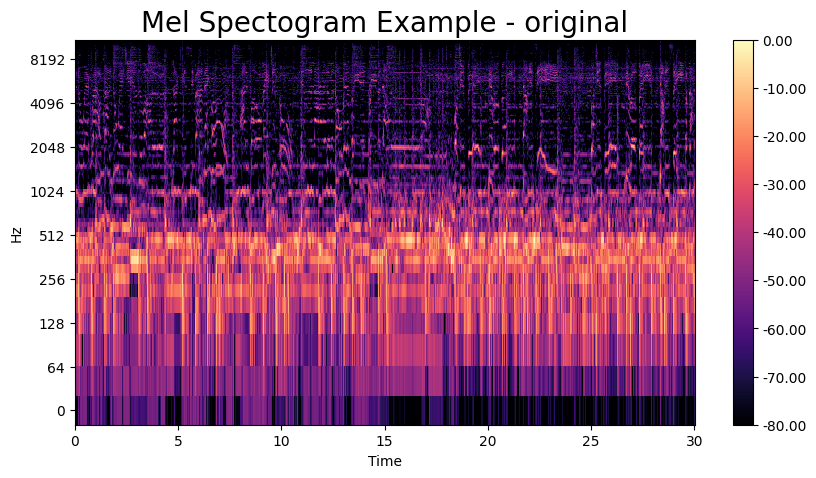

In [36]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - original', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');

## Pitch shift

In [37]:
S = librosa.feature.melspectrogram(y=y_pitch, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1293)


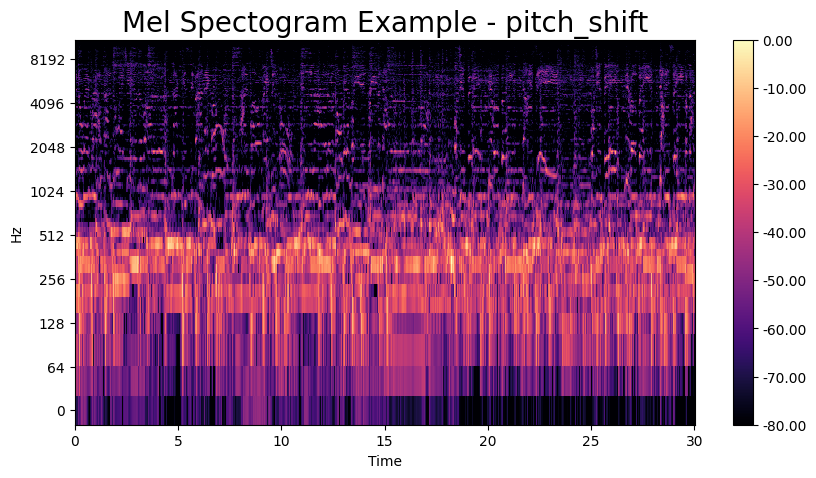

In [38]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - pitch_shift', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');

## Time stretch

In [39]:
S = librosa.feature.melspectrogram(y=y_time_stretch, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1283)


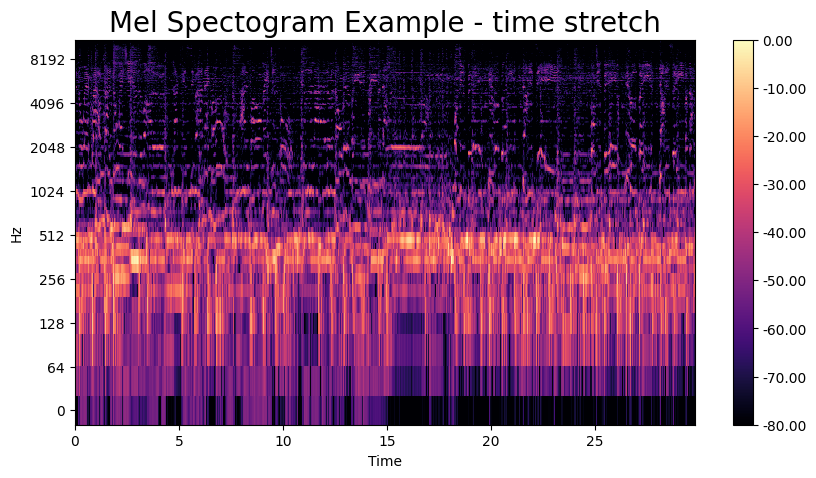

In [40]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - time stretch', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');

## Reverb

In [41]:
S = librosa.feature.melspectrogram(y=y_reverb, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1293)


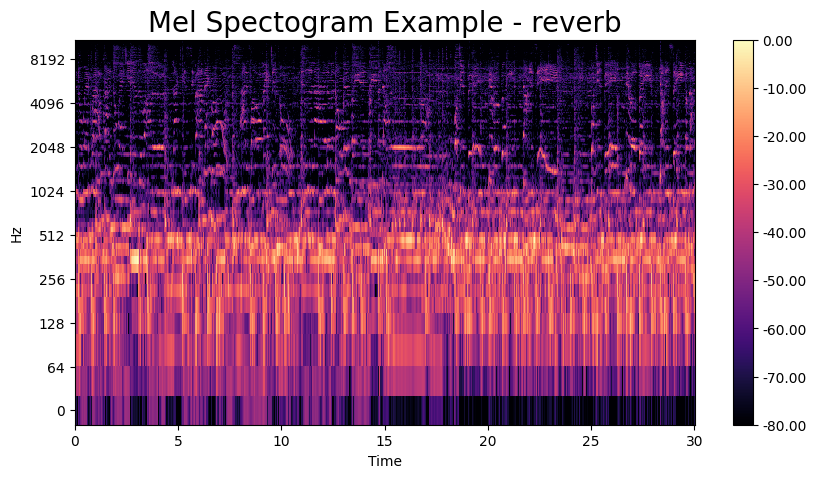

In [42]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - reverb', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');

## Reverb

In [43]:
S = librosa.feature.melspectrogram(y=y_reverb, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1293)


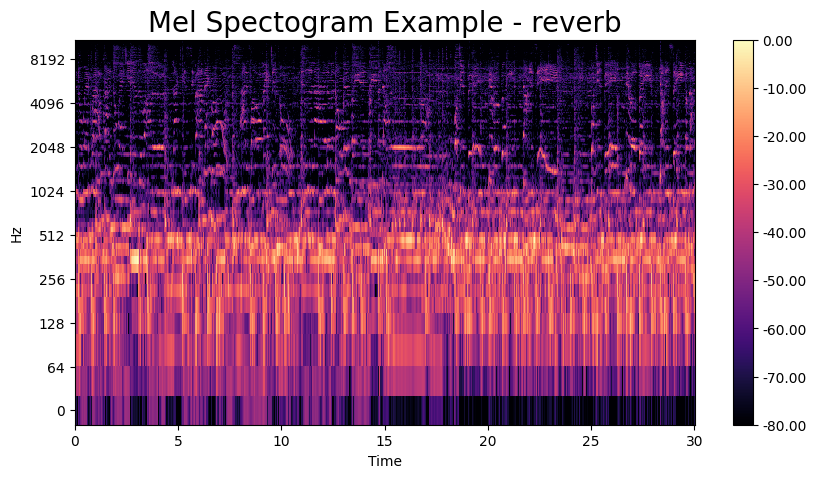

In [44]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - reverb', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');

## All together

In [45]:
S = librosa.feature.melspectrogram(y=y_aug, sr=sr, n_fft=n_fft, n_mels=n_mels, hop_length=hop_length)
print("Shape of Mel Spectogram", S.shape)

# use that converting function as above
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

Shape of Mel Spectogram (256, 1222)


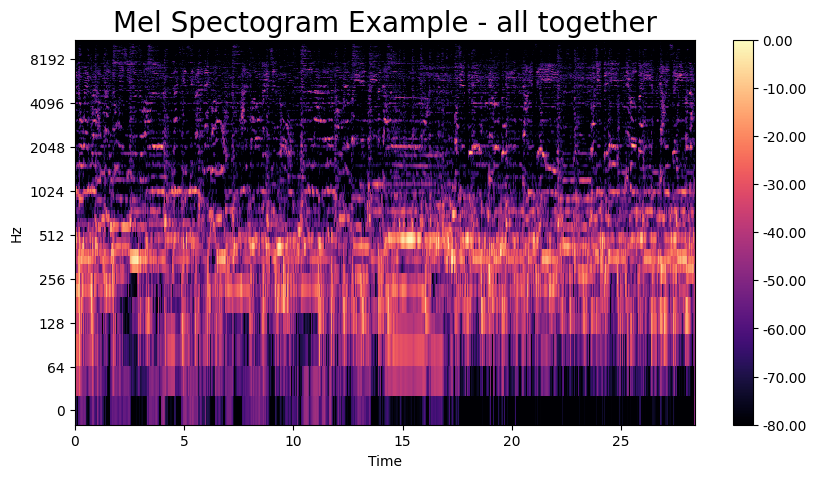

In [46]:
# plot the mel spectogram
fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db_mel, x_axis='time', y_axis='log', ax=ax)
ax.set_title('Mel Spectogram Example - all together', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f');